# Visión por Computador - Práctica 3 - Extracción (y Emparejamiento) de Características y Registrado de Imágenes

#### 11 puntos   |   Fecha de entrega: 31 de Diciembre, 23:59   |   Forma de entrega: a través de la tarea creada en https://pradogrado2425.ugr.es/

### Estudiante: <mark>LAURA LÁZARO SORALUCE</mark>



<font color='blue'>En esta práctica aprenderás:

<font color='blue'>a) A detectar puntos de interés utilizando el detector de esquinas de Harris (Ejercicio 1).

<font color='blue'>b) A encontrar correspondencias entre los _keypoints_ (puntos de interés) de dos imágenes utilizando distintos descriptores (Ejercicio 2).

<font color='blue'>c) A componer un mosaico/panorama a partir de un conjunto de imágenes utilizando homografías (Ejercicio 3).

In [ ]:
# Let's start importing all background modules
# We start by getting access to the drive
from google.colab import drive
drive.mount('/content/drive', force_remount=True)
import sys,os
# change directory
%cd '/content/drive/My Drive'
# Let's import the python module exercises.py  to have access to its functions and Classes
get_image = lambda route: os.path.join('/content/drive/MyDrive/images/', route)
import numpy as np
from matplotlib import pyplot as plt
import cv2

Mounted at /content/drive
/content/drive/My Drive


In [ ]:
'''
This function receives a string with the filename of the image to read,
and a flag indicating if we want to read it in color/RGB (flagColor=1) or gray level (flagColor=0)

Example of use:
im1=readIm(get_image('apple.jpg'),0)

'''
def readIm(filename, flagColor=1):
  # cv2 reads BGR format
  im=cv2.imread(filename)
  # change to  RGB and return the image
  if(flagColor):
    return cv2.cvtColor(im, cv2.COLOR_BGR2RGB)
  # change from BGR to grayscale instead if flag is 0
  return cv2.cvtColor(im, cv2.COLOR_BGR2GRAY)

In [ ]:
'''
This function receives an array of arbitrary real numbers (that could include even negative values),
and returns an 'image' in the range [0,1].
flag_GLOBAL allows the user to normalize the whole image (including all channels) or to normalize
each channel/band independently.
'''
def rangeDisplay01(im, flag_GLOBAL= True):
  im = im.astype(float)
  if flag_GLOBAL:
    im = (im - im.min())/(im.max() - im.min())
  else:
    # bands normalization
    for band in range(im.shape[2]):
      im[:, :, band] = (im[:, :, band] - im[:, :, band].min())/(im[:, :, band].max() - im[:, :, band].min())
      # Note: remember that, for plt.imshow with RGB data, the valid range is [0..1] for floats and [0..255] for integers.
  return im

In [ ]:
'''
This function displays a single image, including a title, using a magnification factor.

Example of use:
im1=readIm(get_image('apple.jpg'),0)
displayIm(im1,'Manzana',0.5)

'''
def displayIm(im, title='Result',factor= 2):
  # First normalize range
  max=np.max(im)
  min=np.min(im)
  if min<0 or max>255:
    im=rangeDisplay01(im,flag_GLOBAL=True)
  if len(im.shape) == 3:
    # im es tribanda
    plt.imshow(im, cmap='jet')
  else:
    # im es monobanda
    plt.imshow(im, cmap='gray')
  figure_size = plt.gcf().get_size_inches()
  plt.gcf().set_size_inches(factor * figure_size)
  plt.title(title)
  plt.xticks([]), plt.yticks([]) # eliminamos numeración
  plt.show()

In [ ]:
'''
This function displays multiple images (including a title and using a magnification factor)
of equal size. The input to the function is a list of images.

Example of use:
im1=readIm(get_image('apple.jpg'),1)
images = [im1,im1,im1]

displayMI_ES(images, title='Manzanas',factor=1)

'''
def displayMI_ES(vim, title='Result',factor=2):
  # We set the maximun number of images to concatenate by columns
  maxcolumns=3
  # number of images to display
  numberim=len(vim)
  # The simplest case, one row: the maximum number of columns is larger than the images to stack
  # This is, by default, we put together the images column-wise
  if len(vim) < maxcolumns:
    out=vim[0]
    for item in range(1,len(vim)):
      #displayIm(out,str(item),1)
      out=np.hstack((out,vim[item]))

  # Else, if maxcolumns is smaller or equal than the number of images to stack
  else:
    # We check if all rows and columns are going to be 'busy', or if otherwise we need an extra-row
    if np.mod(len(vim),maxcolumns)== 0:
      maxrows=numberim//maxcolumns
    else:
      maxrows=numberim//maxcolumns+1

    # we build up the first block-row
    out=vim[0]
    for item in range(1,maxcolumns):
      out=np.hstack((out,vim[item]))
    # We build up the rest of block-rows
    for block in range(1,maxrows):
      #print(block)
      row=vim[block*maxcolumns]
      for item in range(1,maxcolumns):
        # We still have images to stack
        if block*maxcolumns+item < numberim:
          row=np.hstack((row,vim[block*maxcolumns+item]))
        # We do not have more images, and we have to fill with black
        else:
          row=np.hstack((row,np.zeros(vim[0].shape,dtype=vim[0].dtype)))
          #print(row.dtype)
          # if we don't include ',dtype=vim[0].dtype', np.zeros will include float
          # numbers in the matrix. This will make that the whole matrix will be
          # considered as floats, and values larger than 1 will be clipped to 1,
          # displaying an almost totally white image
      # add the new block-row
      out=np.vstack((out,row))
  return displayIm(out,title,factor)

In [ ]:
# Here you include your functions from P1

def GaussFunc(x,sigma):
  # Devuelve la función Gaussiana
  return np.exp(-(x**2)/(2*(sigma**2)))

def GaussDeriv1Func(x,sigma):
  # Devuelve la primera derivada de la función Gaussiana
  return (-(x*GaussFunc(x,sigma))/(sigma**2))

def GaussDeriv2Func(x,sigma):
  # Devuelve la segunda derivada de la función Gaussiana
  return (((x**2)-(sigma**2))*GaussFunc(x,sigma))/(sigma**4)

def gaussianMask1D(sigma=0, sizeMask=0, order=0):
  # Si no se especifica un sigma, lo calculo en función del tamaño de máscara
  if sigma == 0:
      sigma = (sizeMask - 1) / 6
  # Si no se especifica el tamaño de máscara, lo calculo en base al sigma
  elif sizeMask == 0:
      sizeMask = 2* np.ceil(3 * sigma - 0.5) + 1

  # Defino el rango de valores de x, que depende del tamaño de máscara (de -k a k)
  x = np.arange(-(sizeMask//2), sizeMask//2 + 1)

  # order = 0 -> función Gaussiana
  if order == 0:
    mask = GaussFunc(x, sigma)

    # Normalizo la máscara dividiendo entre la suma de sus coeficientes, para que la suma total sea 1
    sum = np.sum(mask)
    if sum != 0:
      mask = mask / sum

  # order = 1 -> derivada de la Gaussiana
  elif order == 1:
    mask = GaussDeriv1Func(x, sigma)
    # Normalizamos multiplicando por sigma
    mask = mask * sigma

  # order = 2 -> derivada segunda de la Gaussiana
  elif order == 2:
    mask = GaussDeriv2Func(x, sigma)
    # Normalizamos multiplicando por sigma^2
    mask = mask * sigma**2

  return mask

In [ ]:
def my2DConv(im, sigma, orders):
  t = 0 # Se calcula en gaussianMask1D
  # Creamos los filtros Gaussianos para suavizado y derivadas
  g=gaussianMask1D(sigma, t, 0)
  dg=gaussianMask1D(sigma, t, 1)
  d2g=gaussianMask1D(sigma, t, 2)
  if orders==[0,0]: # Suavizado Gaussiano
    return cv2.sepFilter2D(im, cv2.CV_64F,g,g)
  elif orders == [1,0]: # Primera derivada de la Gaussiana en X
    return cv2.sepFilter2D(im, cv2.CV_64F, dg, g)
  elif orders == [0, 1]:  # Primera derivada de la Gaussiana en Y
    return cv2.sepFilter2D(im, cv2.CV_64F, g, dg)
  elif orders == [2, 0]:  # Segunda derivada de la Gaussiana en X
    return cv2.sepFilter2D(im, cv2.CV_64F, d2g, g)
  elif orders == [0, 2]:  # Segunda derivada de la Gaussiana en Y
    return cv2.sepFilter2D(im, cv2.CV_64F, g, d2g)
  else:
    print('error in order of derivative')

Aquí también he reutilizado la función que usé en la práctica 1 para calcular la convolución 2D.

# <font color='blue'>**Ejercicio 1:** Harris Corner Detector (3 puntos)

<font color='blue'>Implementar la detección de los 450-500 puntos Harris más fuertes en una imagen (es decir, como mínimo, se deben detectar/mostrar 450 puntos de interés y como máximo 500). Los pasos para implementar el detector de esquinas de Harris son los siguientes: \

> <font color='blue'>a) Fijar las escalas de diferenciación ($\sigma_D$) e integración ($\sigma_I$) en 1.5 y 2.25, respectivamente (aunque también se pueden emplear otros valores de sigma si el estudiante considera que mejoran el rendimiento; esto habría que justificarlo adecuadamente).

> <font color='blue'>b) Calcular las derivadas de la imagen. Para ello, se valorará positivamente el emplear las funciones creadas por el propio alumnado (en lugar de emplear directamente _cv2.getDerivKernels()_, _cv2.GaussianBlur()_, _cv2.filter2D()_ y similares).

> <font color='blue'>c) Calcular los tres términos de la _Second Moment Matrix_ ($SMM$) en cada píxel. Para ello, aplicar convolución con una máscara gaussiana con $\sigma_I$.

> <font color='blue'>d) A partir de la $SMM$, calcular el valor de Harris en cada píxel de la imagen.

> <font color='blue'>e) Aplique la supresión de no máximos mediante la función `corner_peaks()` (https://scikit-image.org/docs/stable/api/skimage.feature.html#skimage.feature.corner_peaks) del módulo `skimage.features`. El estudiante debe seleccionar una `min_distance` adecuada (`The minimal allowed distance separating peaks`) y un umbral de respuesta adecuado en el mapa de Harris para mantener solo la cantidad de _keypoints_ que se solicitan en el enunciado. El resultado será una lista de coordenadas $(x,y)$. Extraiga los valores en estas coordenadas y cree una lista de vectores $(x,y,value)$.

> <font color='blue'>f) Calcule la orientación principal para cada punto. Esto se hace suavizando ambas imágenes derivadas con un sigma suficientemente grande ($\sigma=3$) y, a continuación, calculando la orientación del gradiente en esos puntos.

> <font color='blue'>g) Cree una lista de _keypoints_ usando los puntos seleccionados. Un _keypoint_ suele representarse como un vector que incluye distintos elementos, por ejemplo, $(x,y,scale,orientation)$. En nuestro caso, un _keypoint_ es una estructura de OpenCV (`cv2.KeyPoint`), asociada a cada región detectada, que contendrá las coordenadas $x$ e $y$ del _keypoint_, así como su tamaño ($size$, es decir, el diámetro con el que se va a mostrar) y su orientacion ($angle$, calculada en el paso anterior). El parámetro $size$ de _KeyPoint()_, es decir, el diámetro del _keypoint_ mostrado, debe ser suficientemente grande como para ser visualizado adecuadamente. Una posibilidad es emplear `size=4*np.floor(3*sigmaI)+1`

> <font color='blue'>h) Dibuje los puntos sobre la imagen de entrada usando la función `drawKeyPoints()` (https://docs.opencv.org/4.x/d4/d5d/group__features2d__draw.html#ga5d2bafe8c1c45289bc3403a40fb88920), y los _flags_ `cv2.DRAW_MATCHES_FLAGS_DRAW_OVER_OUTIMG+cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS`.

<font color='blue'>Se deben calcular los puntos de Harris sobre la imagen `IMG_20220312_102944_S.jpg`, y se debe mostrar:
* <font color='blue'>El mapa de respuestas de Harris (valor de Harris) en cada píxel de la imagen,
* <font color='blue'>el mapa de Harris umbralizado, es decir, una vez aplicado supresión de no máximos y un umbral mínimo de respuesta adecuado para obtener el número de puntos de interés solicitados,
* <font color='blue'>y la imagen de entrada con los keypoints finales, junto con el número exacto de _keypoints_ detectados (es decir, es necesario hacer un `print()` con el número de puntos de Harris).





In [ ]:
# Compute image derivatives
def derivatives(im,sigmaD=1.5):
  # Derivadas de la imagen en X y en Y con convolución con la Gaussiana
  dx = my2DConv(im, sigmaD, [1,0])
  dy = my2DConv(im, sigmaD, [0,1])
  return dx,dy

# Compute Harris-criterium Map
def HarrisMap(dx,dy,sigmaI=2.25):
  # Producto y cuadrado de derivadas
  dxx = dx ** 2
  dxy = dx * dy
  dyy = dy ** 2

  # Convolución Gaussiana con sigmaI
  Hxx = my2DConv(dxx, sigmaI, [0,0])
  Hxy = my2DConv(dxy, sigmaI, [0,0])
  Hyy = my2DConv(dyy, sigmaI, [0,0])

  # Determinante / traza
  HMap = (Hxx * Hyy - Hxy ** 2) / (Hxx + Hyy)

  return HMap

En esta última función, detectamos los corners de Harris. Esto es, si hay cambios de intensidad grandes en múltiples direcciones alrededor de un pixel, se considera corner potencial. Aplicamos un filtro Gaussiano a $I_x^2, I_x, I_y,$ y $I_y^2$ para obtener la SMM $H$. Calculamos el valor escalar de los corners usando la fórmula del criterio de Harris: $R=\frac{det(H)}{trace(H)}$.

In [ ]:
from skimage.feature import corner_peaks

def NonMaximaSuppression(harrisMap, min_distance=13, threshold=0.2):
  harrisMap_norm = harrisMap / harrisMap.max()

  # Lista coordenadas (x,y) de los picos
  coord = corner_peaks(harrisMap_norm, min_distance=min_distance, threshold_rel=threshold)

  return coord


En esta función, hacemos la supresión de no-máximos sobre el mapa de Harris. Primero lo normalizamos, dejando todos sus valores en [0,1], ya que los valores del HarrisMap tienen valores que dependen de las intensidades y  de las convoluciones y operaciones que hemos hecho. Al normalizar, el threshold que apliquemos no depende del valor máximo que haya en el mapa de Harris. Con la función corner_peaks buscamos píxeles que sean máximos locales.

min_distance controla la separación mínima ente los puntos clave detectados, define el tamaño del entorno donde se busca el máximo local. Si dos puntos están más cerca que min_distance, se conservará sólo el que tiene mayor respuesta en el mapa de Harris. He escogido min_distance = 10, como punto de partida, para evitar que esten demasido cerca unos puntos de otros y tengamos información redundante. Así tendremos los puntos suficientemente repartidos por la imagen, pero tampoco es tan grande como para no obtener información de regiones importantes. Iré ajustando este valor si veo que las imágenes tienen demasiadas características pequeñas, o si tienen escalas más grandes o menos detalles.

threshold define el valor mínimo de la respuesta de Harris para considerar un punto como punto clave. He escogido 0.1 porque en la respuesta de Harris, los puntos suelen estar entre 0 y 1, y quiero filtrar sólo los que no sean de regiones características. Si detecto menos de 450 puntos clave, disminuiré este valor. Si detecto más de 500, al contrario.

Como se me quedaban demasiados keypoints, decidí subir un poco el threshold, a 0.2, para seleccionar sólo picos con mayor intensidad e ignorar picos más suaves, siendo más selectivos, pues menos puntos claves son seleccionados. Subí también un poco el min_distance a 13, ya que quería que estuviesen bien distribuidos los puntos por la imagen, porque tiene regiones bastante densas. Con esta nueva configuración obtengo los keypoints que necesito, teniendo valores distribuidos y más significativos.

In [ ]:
# compute the orientation map
def orientation(dx,dy):
  # Suavizamos con un sigma suficientemente grande
  dx_smooth = my2DConv(dx, 3, [1,0])
  dy_smooth = my2DConv(dy, 3, [0,1])

  theta = np.arctan2(dy_smooth,dx_smooth)*180 # Fórmula de la orientación
  theta = theta/np.pi
  return theta

size_def = 4*np.floor(3*2.25)+1
# Create the KeyPoint list from the lists of locations, orientations and scales
def keyPoints(coord,theta,size=size_def):
  keyPoints=[]
  for i, (y,x) in enumerate(coord):
    kp=cv2.KeyPoint(x=float(x), y=float(y), size=size, angle=np.degrees(theta[y,x]))
    keyPoints.append(kp)
  return(keyPoints)


Recordamos que la orientación en grados se calcula como $\sigma = arctan(\frac{dy}{dx})*\frac{180}{\pi}$, como vimos en teoría. Esto nos da el mapa con la dirección del gradiente en cada píxel, cosa que vamos a necesitar para detectar las esquinas. Antes de calcular la orientación, suavizamos las derivadas con un filtro Gaussiano para reducir posible ruido.

Para la función de keyPoints, establecemos el tamaño en función del valor $σ_{I}$, como se nos indica en el enunciado. Para cada par de coordenadas, obtenemos el keypoint y lo añadivos al vector de keypoints que vamos a devolver. Son todos del mismo tamaño, y en todos se indica la orientación del gradiente, para mostrarla. Utilizamos la orientación para asignarle el ángulo a cada keyPoint. Usamos la clase cv2.KeyPoint para representarlos y poder usarlos más fácilmente con otros métodos como DrawKeyPoints().

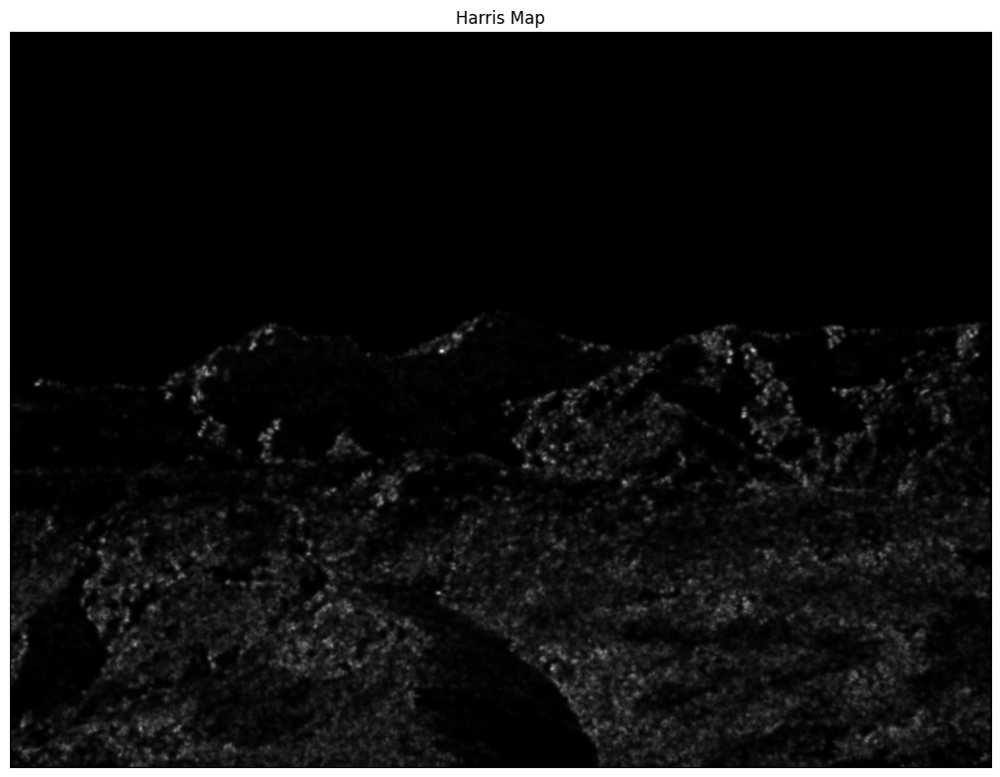

In [ ]:
img=readIm(get_image('IMG_20220312_102944_S.jpg'),1)
gray_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY) # La ponemos en escala de grises
dx,dy = derivatives(gray_img)
harrisMap = HarrisMap(dx,dy)
displayIm(harrisMap,'Harris Map', 2)


Leemos la imagen que queremos estudiar y de la que vamos a sacar los corners. Convertimos la imagen a escala de grises, que es necesario para hacer el cálculo de Harris Corner, también porque es más fácil procesar las derivadas en imágenes de un sólo canal que de tres. Calculamos las derivadas de la imagen en ambas direcciones, para construir la SMM.

En los resultados vemos que se ve la imagen en escala de grises, donde las esquinas más llamativas son las que aparecen como áreas brillantes.

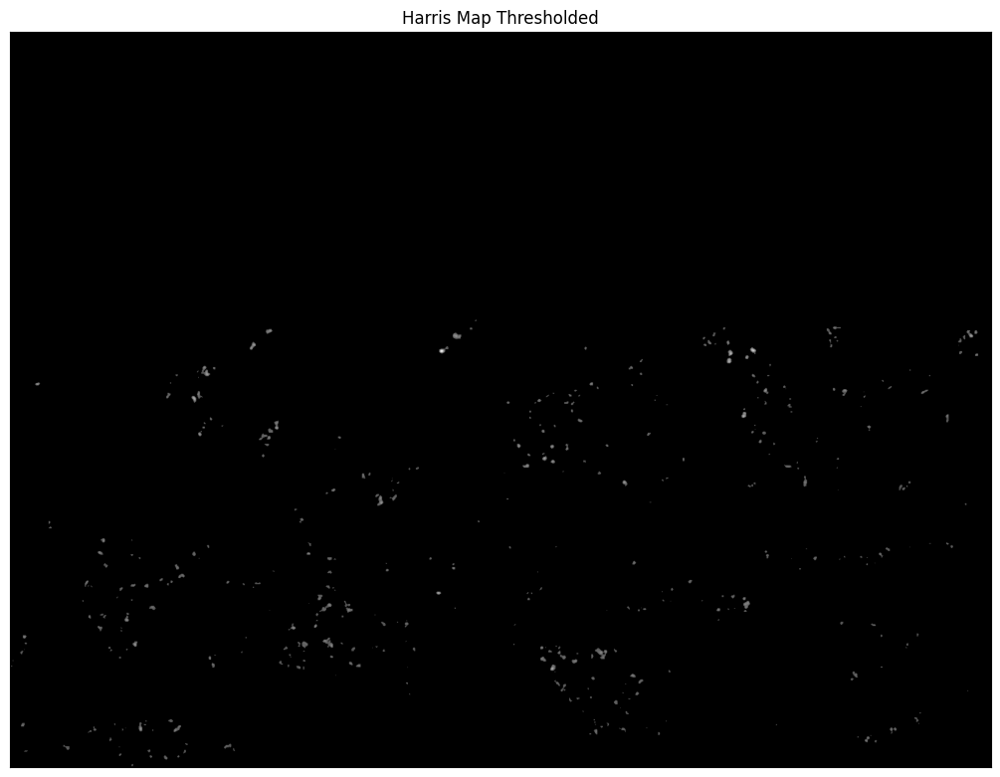

In [ ]:
img=readIm(get_image('IMG_20220312_102944_S.jpg'),1)
gray_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY) # A escala de grises

dx,dy = derivatives(gray_img)
harrisMap2 = HarrisMap(dx,dy) # Mapa de Harris
coord = NonMaximaSuppression(harrisMap2) # Supresión de no-máximos

map_thresholded=np.zeros_like(harrisMap2)
for y,x in coord:
  map_thresholded[y,x] = harrisMap2[y,x]

threshold = map_thresholded.max()*0.3 # Aplicamos threshold

# Nos quedamos con los bordes más fuertes
harrisMapThresholded = harrisMap2.copy()
harrisMapThresholded[harrisMap2 < threshold] = 0

displayIm(harrisMapThresholded, 'Harris Map Thresholded', 2)

Aquí aplicamos el algoritmo de Harris para detectar bordes y luego hacemos un umbralizado del mapa para visualizar sólo las esquinas más prominentes. Procedemos de la misma manera que en el ejercicio anteior. Hacemos supresión de no máximos, identificando las coordenadas de los picos locales en el mapa de Harris. Así sólo nos quedamos con las esquinas más relevantes. Calculamos el valor del threshold como el 30% del valor máximo de entre los puntos localizados tras suprimir máximos, es decir, todos los corners potenciales. Todos los puntos del mapa de Harris que estén por debajo de dicho umbral, los eliminamos. Esto serán las esquinas menos destacadas y puede que algo de ruido que se hubiese colado. Efectivamente, vemos que se nos quedan sólo algunos puntos que antes salían como los más brillantes, los más destacados.

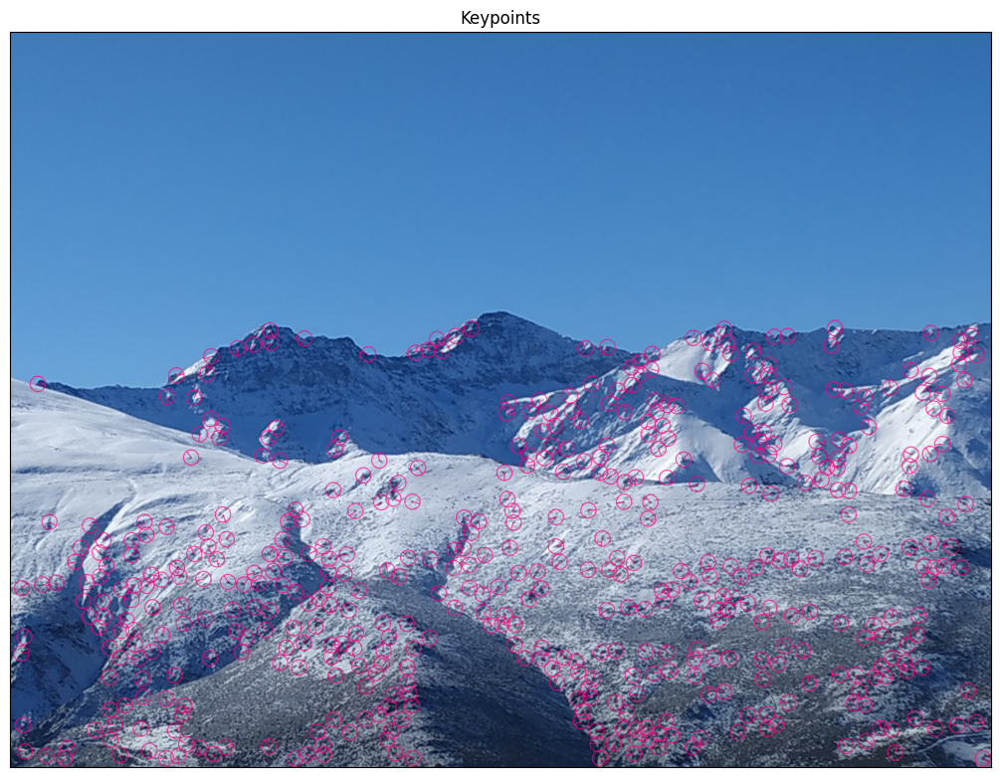

Number of Keypoints Detected: 486


In [ ]:
img=readIm(get_image('IMG_20220312_102944_S.jpg'),1)
gray_img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

dx,dy = derivatives(gray_img)
harrisMap2 = HarrisMap(dx,dy)
coord = NonMaximaSuppression(harrisMap2)

theta = orientation(dx,dy)
keypoints = keyPoints(coord,theta)
output_img = img.copy()
output_img = cv2.drawKeypoints(img, keypoints, output_img, color=(255,0,128), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_OVER_OUTIMG + cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
displayIm(output_img, 'Keypoints', 2)

print(f"Number of Keypoints Detected: {len(coord)}")


Aquí detectamos las esquinas, calculamos las orientaciones y visualizamos importantes los puntos sobre la imagen original. Comenzamos haciendo lo mismo que en los ejercicios anteriores, obtenemos el mapa de Harris e identificamos las coordenadas de los corners más relevantes suprimiendo no máximos. Para cada punto de interés, calculamos su orientación asociada para representarlo. Cada esquina detectada se convierte en un keypoint que guarda información de la posición y orientación del corner, y que mostramos encima de la imagen original. Hemos detectado 486 gracias a los ajustes en la supresión de no máximos, por lo que estamos dentro de los límites impuestos. Además, vemos que están bastante repartidos por distintas áreas de la imagen, y no sólo se centran en pocas, pero no llegan a aparecer en áreas más homogéneas que no aportan demasiada información de corners (por lo que la elección de min_distance parece razonable).

# <font color='blue'>**Ejercicio 2:** Emparejamiento de _keypoints_ entre imágenes usando descriptores SIFT, HOG y LBP (3 puntos)

<font color='blue'>En este apartado, partiendo de un detector de características (SIFT) y tres descriptores de características (SIFT, HOG y LBP), vamos a calcular el emparejamiento entre _keypoints_ de dos imágenes. Las imágenes con las que se trabajará en este ejercicio serán `IMG_20220312_102940_S.jpg` y `IMG_20220312_102944_S.jpg`. Estas imágenes son de $1200\times1600$ pero, tras leerlas, se debe reducir su tamaño a la mitad ($600\times800$). Es en esta última dimensionalidad en la que realizaremos todo el ejercicio y visualizaremos las imágenes. Y, a continuación, debemos pasarlas a escala de grises. Nota importante: del mismo modo que se calculan _keypoints_ y descriptores en escala de grises, luego los matches/emparejamientos sí se visualizan sobre las imágenes originales en color.

## <font color='blue'>SIFT (Scale-invariant feature transform)

<font color='blue'>En un primer momento, el alumnado debe aplicar el algoritmo SIFT a ambas imágenes para extraer los puntos de interés (_keypoints_) y los descriptores (https://docs.opencv.org/3.4/dc/dc3/tutorial_py_matcher.html). Luego, vamos a emplear tres criterios de emparejamiento: _brute force_ (`cv2.BFMatcher`), _brute force with cross-check_ (`cv2.BFMatcher` con `crossCheck=True`) y el _Lowe's ratio test_ (`knnMatch`) para calcular los emparejamientos y mostrar los 100 mejores matches utilizando la función `cv2.drawMatches`.

<font color='blue'>En los siguientes apartados, emplearemos exactamente los mismos _keypoints_ detectados por SIFT para calcular otros descriptores en dichas localizaciones y comparar los resultados obtenidos. En los próximos apartados también se utilizarán y compararán los mismos tres criterios de emparejamiento indicados (_BF_, _BF+CC_ y _Lowe's ratio test_).

In [ ]:
def siftPoints(im,nfeatures=5000):
  sift = cv2.SIFT_create(nfeatures)
  kp,ds = sift.detectAndCompute(im,None)
  return kp,ds

Obtenemos una lista de keuypoints detectados y los descriptores asociados a estos, utilizando el algoritmo SIFT.

In OpenCV the output of a matching process is a vector of records. Each record provides information about the indexes of the matched KeyPoints and the distance between them.

In [ ]:
# This function display the KeyPoints of an image
def showKP(im,kp,title):
  img=cv2.drawKeypoints(im, kp, None, color=(255,0,128), flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
  displayIm(img,title,1)

# This function display the matches between two images
def showMatches(im1,kp1,im2,kp2,matches, N, title='Matches'):
  imBF=cv2.drawMatches(im1, kp1, im2, kp2, matches[:N], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)
  displayIm(imBF,title,2)

#This function compute matches between descriptors of two images
def matching(ds1,ds2,FlagMode='BF+CC'):
  if FlagMode=='BF':
    bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=False)
    matches = bf.match(ds1, ds2)
    matches = sorted(matches, key=lambda x: x.distance)
    return matches
  elif FlagMode=='BF+CC':
    bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=True)
    matches = bf.match(ds1, ds2)
    matches = sorted(matches, key=lambda x: x.distance)
    return matches
  elif FlagMode=='KNN':
    bf = cv2.BFMatcher(cv2.NORM_L2, crossCheck=False)
    knn_matches = bf.knnMatch(ds1, ds2, k=2)
    good = []
    for m, n in knn_matches:
        if m.distance < 0.75 * n.distance:  # Lowe's ratio test
            good.append(m)
    return good
  else:
    return print('Error in Matching mode')


Para mostrar lso keypoints, le pasamos como argumento la imagen sobre la que se van a mostrar los keyPoints, la lista de estos y el título del gráfico. Se dibujan los keypoints sobre la imagen usando un color rosa que he escogido y mostrando la orientación y tamaño de cada keypoint con el flag escogido.

En showMatches, visualizamos los emparejamientos entre dos imágenes y sus respectivos keypoints. Le pasamos las dos imágenes, los dos conjuntos de keypoints, la lista de matches entre los descriptores, el número de matches que queremos mostrar (en nuestro caso 100) y el título. Se dibujan líneas que conecten los keypoints que coinciden entre ambas imágenes, pero no se dibujan los puntos aislados en las imágenes, sólo las líneas. Sólo mostramos los N primeros matches de mejor calidad, ya que están ordenados por la menor distancia.

En matching, hacemos el emparejamiento entre los descriptores de dos imágenes, por lo que le pasamos ambos conjuntos de descriptores y el método mediante el que se emparejan.
- Brute Force: usamos distancia euclidia y sin crossCheck. Compara cada descriptor con todos los demás y selecciona el más cercano según la distancia euclidea.
- Brute Force con CrossCheck: crossCheck garantiza que los emparejamientos sean mutuos, que si el descriptor A de la imagen 1 se empareja con el B de la imagen 2, el B se va a emparejar con el A.
- KNN: obtenemos los k vecinos más cercanos para cada descriptor. Aplicamos el Lowe's ratio test, donde si la distancia del primer match es menor que el 75% de la distancia del segundo match, entonces es un emparejamiento válido. Así, un buen emparejamiento debe ser bastante más cercano que cualquier otro descriptor.

Se devuelven todos los matches.

In [ ]:
numberOfmatches = 100

In [ ]:
# Reducimos a la mitad el tamaño de las imágenes
img1=cv2.resize(readIm(get_image('IMG_20220312_102940_S.jpg'),1), (0,0), fx=0.5, fy=0.5)
im1=cv2.cvtColor(img1,cv2.COLOR_RGB2GRAY)
img2=cv2.resize(readIm(get_image('IMG_20220312_102944_S.jpg'),1), (0,0), fx=0.5, fy=0.5)
im2=cv2.cvtColor(img2,cv2.COLOR_RGB2GRAY)

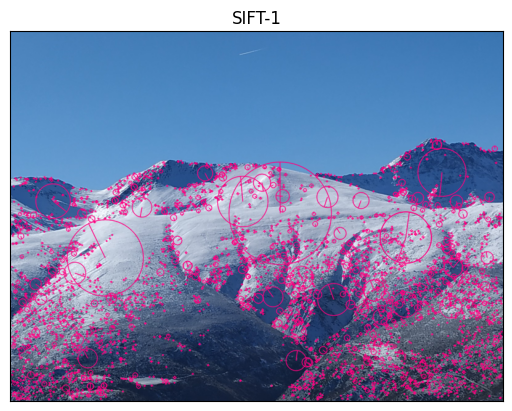

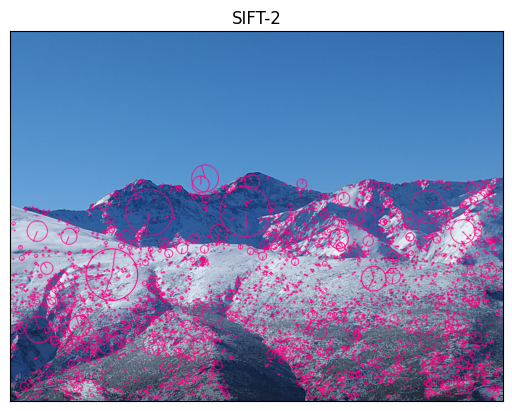

Dimensión de cada descriptor SIFT: 128


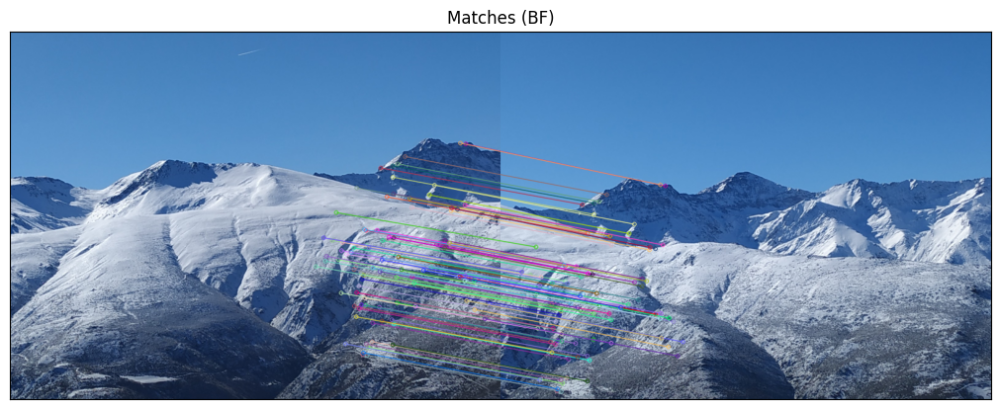

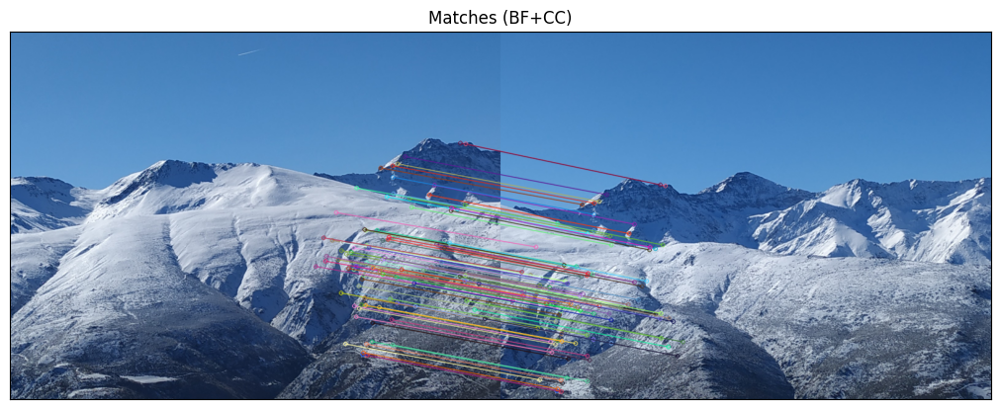

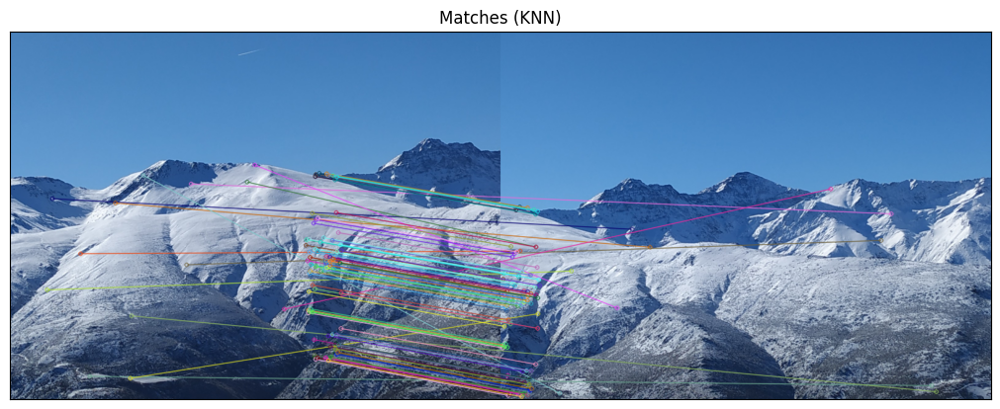

In [ ]:
kp1, ds1 = siftPoints(im1)
kp2, ds2 = siftPoints(im2)

# Mostramos keypoints
showKP(img1, kp1, "SIFT-1")
showKP(img2, kp2, "SIFT-2")

# Dimensión descriptor SIFT
print(f"Dimensión de cada descriptor SIFT: {ds1.shape[1] if ds1 is not None else 'No hay descriptores'}")

# Emparejamiento de descriptores y visualización
matches = matching(ds1, ds2, FlagMode='BF')
showMatches(img1, kp1, img2, kp2, matches, numberOfmatches, title=f"Matches ({'BF'})")

matches = matching(ds1, ds2, FlagMode='BF+CC')
showMatches(img1, kp1, img2, kp2, matches, numberOfmatches, title=f"Matches ({'BF+CC'})")

matches = matching(ds1, ds2, FlagMode='KNN')
showMatches(img1, kp1, img2, kp2, matches, numberOfmatches, title=f"Matches ({'KNN'})")

Detectamos los keypoints y descriptores para las dos imágenes que hemos cargado, con el método SIFT. Mostramos los keypoints en ambas imágenes. Cuando el keypoint es más grande, representa una característica más grande de la imagen, mientras que al contrario es una característica más fina. Emparejamos los descriptores usando los tres métodos implementados anteriormente y visualizamos los matches. Vemos que usando KNN es donde vemos que se han hecho más matching incorrectos aparentemente, pues se ve que en muchos casos, se unen dos puntos que no pertenecen a la misma región en ambas imágenes. Los otros dos métodos de matching parecen dar resultados mucho más razonables.

## <font color='blue'>LBP (Local Binary Patterns)

<font color='blue'>Ahora, vamos a hacer lo mismo de antes, pero empleando las características LBP (del paquete `mahotas`: `mahotas.features.lbp`). Para ello debemos crear una pequeña ventana ($7\times7$ pixels) centrada en torno a los SIFT keypoints detectados, y calcular el vector de características correspondiente (empleando `radius=1` y `points=8`).

<font color='blue'>¿Posee este vector de características el tamaño indicado en teoría? Si no es así, ¿a qué se puede deber?


In [ ]:
!pip install mahotas

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.8/5.8 MB 34.4 MB/s eta 0:00:00


Dimensión de cada descriptor LBP: 36


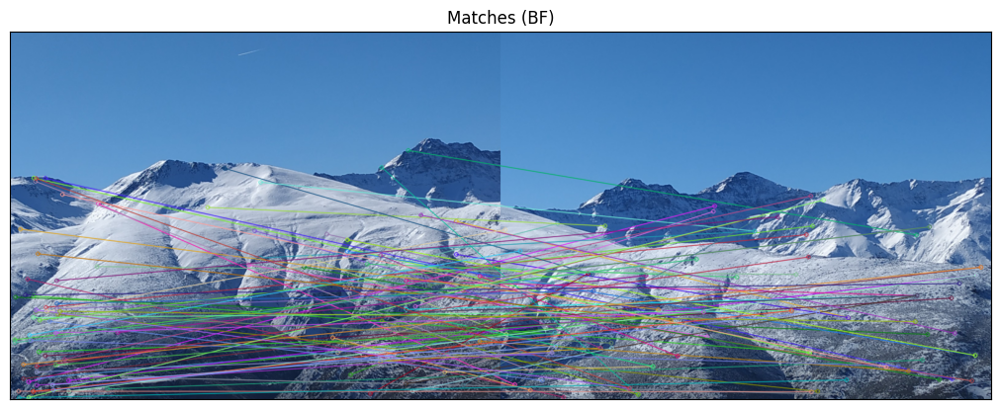

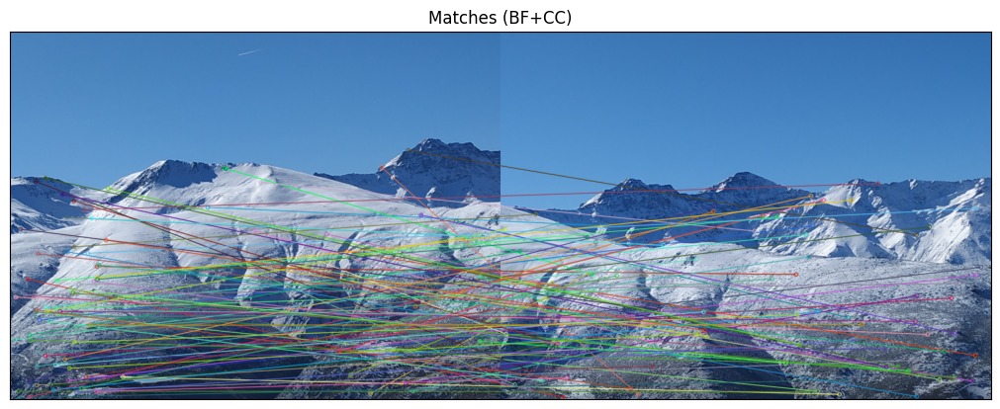

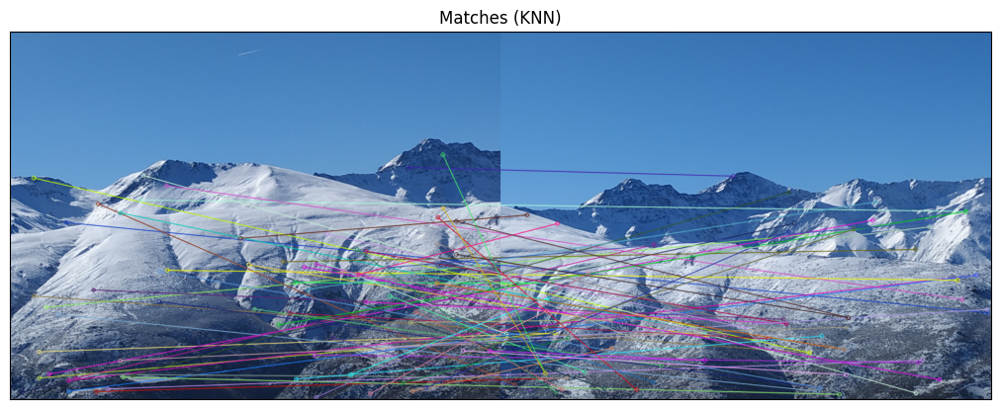

In [ ]:
import mahotas

# Función para calcular descriptores LBP
def calculate_lbp_descriptors(image, keypoints, radius=1, points=8, window_size=7):
    descriptors = []
    half_window = window_size // 2

    for kp in keypoints: # Para cada keyPoint
        x, y = int(kp.pt[0]), int(kp.pt[1])
        # Extraemos la ventana centrada en el keyPoint
        if x - half_window >= 0 and y - half_window >= 0 and x + half_window < image.shape[1] and y + half_window < image.shape[0]:
            window = image[y-half_window:y+half_window+1, x-half_window:x+half_window+1]
            # Calculamos LBP
            lbp = mahotas.features.lbp(window, radius, points)
            descriptors.append(lbp)
    return np.array(descriptors, dtype=np.float32)

img1 = cv2.resize(readIm(get_image('IMG_20220312_102940_S.jpg'), 1), (0, 0), fx=0.5, fy=0.5)
im1 = cv2.cvtColor(img1, cv2.COLOR_RGB2GRAY)
img2 = cv2.resize(readIm(get_image('IMG_20220312_102944_S.jpg'), 1), (0, 0), fx=0.5, fy=0.5)
im2 = cv2.cvtColor(img2, cv2.COLOR_RGB2GRAY)

# Detectamos keypoints con SIFT
kp1, _ = siftPoints(im1)
kp2, _ = siftPoints(im2)

# Descriptores LBP para ambas imágenes
lbp_descriptors1 = calculate_lbp_descriptors(im1, kp1)
lbp_descriptors2 = calculate_lbp_descriptors(im2, kp2)

# Vemos el tamaño del descriptor
print(f"Dimensión de cada descriptor LBP: {lbp_descriptors1.shape[1] if lbp_descriptors1.size else 'No hay descriptores'}")

# Emparejamos descriptores y visualizamos
matches = matching(lbp_descriptors1, lbp_descriptors2, FlagMode='BF')
showMatches(img1, kp1, img2, kp2, matches, numberOfmatches, title="Matches (BF)")

matches = matching(lbp_descriptors1, lbp_descriptors2, FlagMode='BF+CC')
showMatches(img1, kp1, img2, kp2, matches, numberOfmatches, title="Matches (BF+CC)")

matches = matching(lbp_descriptors1, lbp_descriptors2, FlagMode='KNN')
showMatches(img1, kp1, img2, kp2, matches, numberOfmatches, title="Matches (KNN)")

Primero tenemos una función para calcular los despriptores LBP para los keypoints de las imágenes. Para cada keypoint, se extrae una ventana centrada en el punto en la imagen que estamos analizando, calculamos el LBP y lo agregamos a una lista de descriptores. En LBP, aunque no se vea explícitamente, el método mahotas.features.lbp compara la intensidad de cada píxel vecino de la ventana con el píxel central. Points nos dice el número de vecinos en la circunferencia definida por radiuss. Si el valor del píxel vecino es mayor o igual que el central, se asigna un valor de 1, si no, un 0. Los patrones obtenidos generan un número binario que se convertirá a su respectivo número decimal, que es el que guardamos. El número binario se puede generar en sentido horario o antihorario, pero siempre en el mismo sentido.

Como LBP es un descriptor pero no un detector, tenemos que seguir usando SIFT para detectar keypoints, ya que SIFT sí es ambas cosas. Calculamos los descriptores LBP en los keypoints y realizamos los emparejamientos siguiendo los mismos tres métodos de antes.

En cuanto a los resultados obtenidos, en la teoría, habíamos visto que deberíamos obtener un vector de tamaño 256. Pues eran los valores del histograma, que va de 0 a 255 si cogemos 8 píxeles alrededor del central, pues eso se traduce en 8 posiciones binarias, lo que llega hasta $2^8=256$ en decimal. En nuestro caso, obtenemos un vector de tamaño 36. Esto se debe a que estamos usando LBP uniforme, que es una variante optimizada de LBP que utiliza por defecto mahotas.features.lbp.

https://cvexplained.wordpress.com/2020/07/22/10-7-local-binary-patterns/

Utilizando información de la web anterior, vemos que hay 36 patrones binarios posibles (invariantes a rotación), cuando points=8, que es nuestro caso. Esto es porque la versión uniforme de LBP se queda sólo con los patrones que tienen sólo 0, 1 o 2 cambios de 0 a 1. Esta versión uniforme captura la mayoría de la información relevante y además acelera el cálculo porque se reducen los patrones de 256 a 36. Por lo tanto, aunque no coincide con el valor esperado según lo visto en teoría (porque no se usa LBP uniforme), sí que coincide con la teoría de esta variante.

En las imágenes y los matches que obtenemos, vemos que es más difícil interpretar si se han hecho bien o no que con SIFT, porque las líneas que unen las imágenes están mucho más dispersas y se ve peor. Aún así, sí que vemos que se unen puntos en ambas imágenes (tanto con BF, como con BF+CC y KNN) que no pertenecen a la misma región.

## <font color='blue'>HOG (Histogram of oriented gradients)

<font color='blue'>Ahora hacemos lo mismo, pero con la implementación de HOG disponible en `skimage.feature`. Se deben emplear $9$ orientaciones, $8\times8$ pixels por celda, y $2\times2$ celdas por bloque (importante hacer _resize_ de la ventana/región de $7\times7$ al tamaño estándar de HOG: $64\times128$ pixels). ¿Cuál es la dimensionalidad de este vector de características y por qué?

Dimensión de cada descriptor HOG: 3780


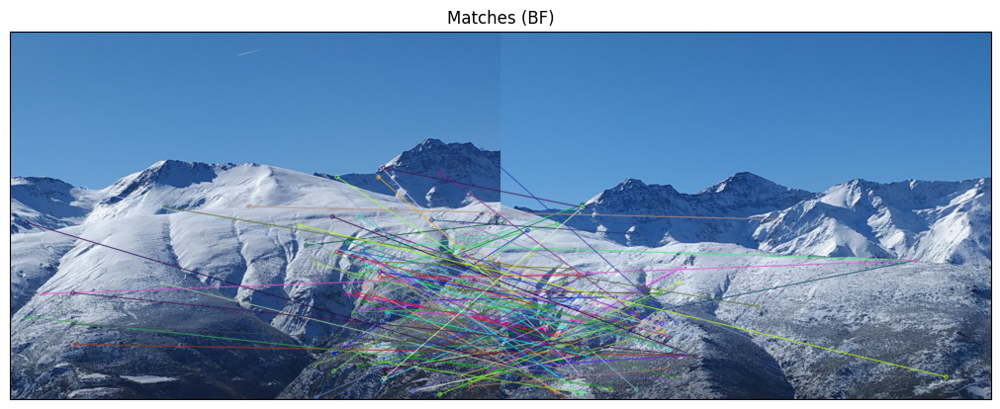

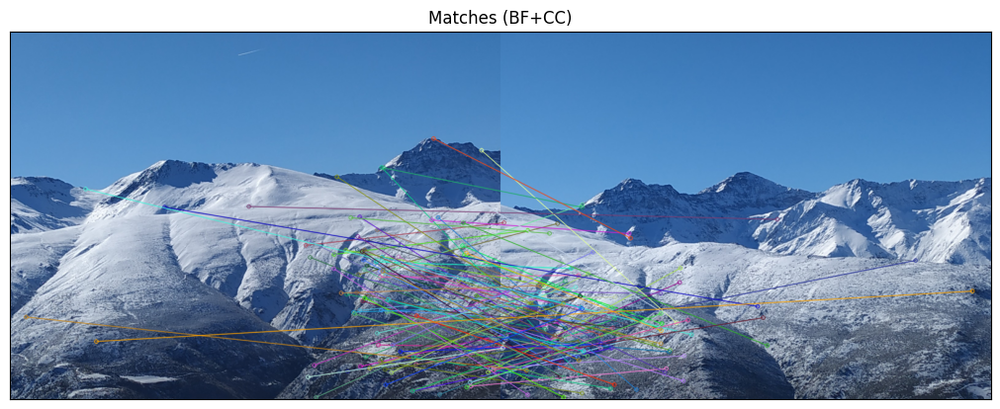

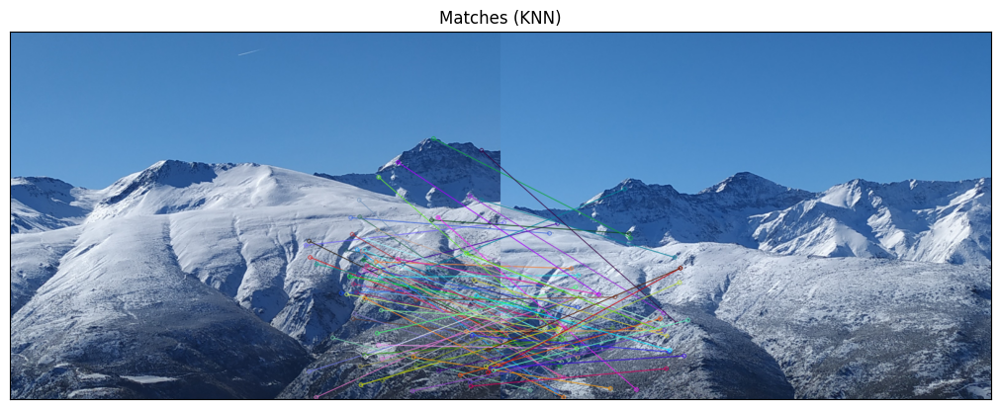

In [ ]:
from skimage.feature import hog
from skimage.transform import resize

# Función para calcular descriptores HOG
def calculate_hog_descriptors(image, keypoints, window_size=7, hog_size=(64, 128), orientations=9, pixels_per_cell=(8, 8), cells_per_block=(2, 2)):
    descriptors = []
    half_window = window_size // 2
    for kp in keypoints:
        x, y = int(kp.pt[0]), int(kp.pt[1])
        # Extraemos ventana centrada en el keyPoint
        if x - half_window >= 0 and y - half_window >= 0 and x + half_window < image.shape[1] and y + half_window < image.shape[0]:
            window = image[y-half_window:y+half_window+1, x-half_window:x+half_window+1]
            # Redimensionamos la ventana al tamaño estándar de HOG
            resized_window = resize(window, hog_size, anti_aliasing=True)
            # Calculamos HOG
            hog_descriptor = hog(resized_window,
                                 orientations=orientations,
                                 pixels_per_cell=pixels_per_cell,
                                 cells_per_block=cells_per_block,
                                 block_norm='L2-Hys')
            descriptors.append(hog_descriptor)
    return np.array(descriptors, dtype=np.float32)

img1 = cv2.resize(readIm(get_image('IMG_20220312_102940_S.jpg'), 1), (0, 0), fx=0.5, fy=0.5)
im1 = cv2.cvtColor(img1, cv2.COLOR_RGB2GRAY)
img2 = cv2.resize(readIm(get_image('IMG_20220312_102944_S.jpg'), 1), (0, 0), fx=0.5, fy=0.5)
im2 = cv2.cvtColor(img2, cv2.COLOR_RGB2GRAY)

# Detectamos keypoints con SIFT
kp1, _ = siftPoints(im1)
kp2, _ = siftPoints(im2)

# Calculamos descriptores HOG
hog_descriptors1 = calculate_hog_descriptors(im1, kp1)
hog_descriptors2 = calculate_hog_descriptors(im2, kp2)

# Vemos el tamaño del descriptor
print(f"Dimensión de cada descriptor HOG: {hog_descriptors1.shape[1] if hog_descriptors1.size else 'No hay descriptores'}")

# Emparejamos descriptores y visualizamos
matches = matching(hog_descriptors1, hog_descriptors2, FlagMode='BF')
showMatches(img1, kp1, img2, kp2, matches, numberOfmatches, title="Matches (BF)")

matches = matching(hog_descriptors1, hog_descriptors2, FlagMode='BF+CC')
showMatches(img1, kp1, img2, kp2, matches, numberOfmatches, title="Matches (BF+CC)")

matches = matching(hog_descriptors1, hog_descriptors2, FlagMode='KNN')
showMatches(img1, kp1, img2, kp2, matches, numberOfmatches, title="Matches (KNN)")

Definimos la función para calcular los descriptores HOG para los keypoints de las imágenes. Para cada keypoint, extraemos, al igual que en LBP, una ventana centrada en el keypoint. Redimensionamos la ventana, porque sabemos que HOG trabaja sólo con 64x128 píxeles. Se calcula el descriptor HOG para la ventana utilizando el número de orientaciones, celdas por bloque y tamaño de celda especificado. HOG calcula los gradientes de la imagen de entrada. Crea bloques de 16x16 píxeles, cada uno con 2x2 celdas de tamaño 8x8. Representamos en un histograma de 9 valores (de 0 a 8) la orientacion del gradiente de cada celda. El voto (lo que se suma al histograma en el valor correspondiente) es la magnitud del gradiente. Se normalizan los histogramas para reducir el efecto de la variación de iluminación. Concatenamos los histogramas y obtenemos un vector de características de dimensión 3780. Los descriptores los añadimos a una lista.

De resto, procedemos como en el caso de LBP.

Comprobamos que efectivamente, obtenemos 3780 como tamaño del vector de cada descriptor, que era lo esperado.

De nuevo, vemos que es difícil interpretar bien si los matches se han hecho corretamente, pero sí vemos que parece que con KNN, se centran más en las regiones correspondientes en ambas imágenes. Con los otros dos métodos de matching, se unen keyPoints que están en regiones muy distintas.

<font color='blue'> ¿Cuál de los descriptores anteriores parece más adecuado para _keypoint matching_ y por qué?

Con las interpretaciones de las imágenes que ya hemos comentado, vemos que en el caso de SIFT observamos correspondencias claras y correctas. Además se centran en áreas importantes de la imagen, como bordes de montañas y picos. Esto puede deberse a que SIFT es un descriptor robusto frente a cambios de escala, rotación e iluminación, como sabemos de teoría.

LBP captura patrones de textura en pequeñas regiones de la imagen, y lo que podría estar pasando es que está uniendo keypoints que tienen texturas similares, aunque no pertenezcan a las mismas regiones en ambas imágenes.

HOG suele ser más efectivo en casos en los que queremos detectar estructuras globales, no tan particulares como pequeños detalles a nivel local. Aún así, parece dar mejores resultados que LBP, pero peores que SIFT.

SIFT parece ser el descriptor más adecuado para la tarea de keyPoint matching.

# <font color='blue'>**Ejercicio 3:** Creación de panoramas/mosaicos (_Image Stitching_) empleando homografías (5 puntos)

<font color='blue'>Ahora vamos a calcular homografías entre imágenes y usarlas para construir un mosaico/panorama. Para calcular la homografía entre dos imágenes, hay que llamar a la función `cv2.findHomography()`, que toma como entrada las listas de _keypoints_ y los matches/emparejamientos encontrados. Se debe usar RANSAC para realizar una estimación robusta.

In [ ]:
# this function computes a homography
def homography(kp1,kp2,matches, Ransac_Error,MIN_MATCH_COUNT=20):
  # Extraemos puntos de los matches
  src_pts = np.float32([keypoint.pt for keypoint in kp1]).reshape(-1, 1, 2)
  dst_pts = np.float32([keypoint.pt for keypoint in kp2]).reshape(-1, 1, 2)

  if len(matches) > MIN_MATCH_COUNT:
    src_pts = np.float32([src_pts[m.queryIdx] for m in matches])
    dst_pts = np.float32([dst_pts[m.trainIdx] for m in matches])
    # Calculamos la homografía usando RANSAC
    (H, mask) = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, Ransac_Error)

    return (matches, H, mask)
  else:
    print('Error - very few matches')
    return None

Con esta función, calculamos la matriz de homografía entre dos conjuntos de keypoints detectados en dos imágenes. Esto es, calcula una transformación geométrica que nos dice como llevar los puntos de una imagen a otra. Es una matriz 3x3, por eso usamos resize, si no tendríamos una 1x3. Las usamos para alinear una imagen respecto a otra, pues si tenemos un punto en una imagen, pordemos encontrar su posición en la otra imagen con la homografía:
$ \begin{bmatrix} x' \\ y' \\ w' \end{bmatrix} = H · \begin{bmatrix} x \\ y \\ 1 \end{bmatrix} $.

Usamos RANSAC para calcular la homografía porque ayuda a reducir el impacto de outliers en los matches entre keypoints, como vimos en teoría. Esto es porque los keypoints pueden tener errores debido a ruido o errores en el emparejamiento. RANSAC busca los keypoints que mejor cumplen la homografía, ignorando los incorrectos. Usamos MIN_MATCH_COUNT para asegurar que sólo se calculan homografías si hay suficientes puntos de correspondencia.

Para el código, me he basado en los links recomendados en las diapositivas de la asignatura:
- https://youtu.be/uMABRY8QPe0?si=T1gEVqPElOWMu0Co
- https://github.com/rohan-paul/MachineLearning-DeepLearning-Code-for-my-YouTube-Channel/blob/master/OpenCV_Image_Processing/Image%20Stitching%20and%20Creating%20Image%20Panorama%20with%20OpenCV/Image_Stiching_and_Creating_Panorama_OpenCV.ipynb.

<font color='blue'>Para componer el mosaico necesitamos realizar los siguientes pasos:

> <font color='blue'>a) Escoger un tamaño máximo para el lienzo/canvas sobre el que vamos a pegar y "encajar" todas las imágenes (tamaño que depende del número de imágenes a unir/componer y sus dimensiones).

> <font color='blue'>b) Escoger la imagen central que dará los ejes al mosaico (que debemos escoger con criterio, de cara a mejorar la calidad final del mosaico).

> <font color='blue'>c) Establecer el orden de cada imagen respecto a la central (es decir, podemos asumir que, a priori, conocemos la posición de cada imagen en la serie de imágenes tomadas y, como consecuencia, conocemos qué imágenes están a la derecha y/o a la izquierda de otras; en otras palabras, conocemos el orden en que fueron tomadas las fotografías en el movimiento de izquierda a derecha sacando la panorámica).

> <font color='blue'>d) Calculamos la homografía para copiar la imagen central en el lienzo (que es solamente una traslación).

> <font color='blue'>e) A continuación debemos ir leyendo las imágenes de izquierda a derecha, y debemos calcular la homografía entre cada par de imágenes consecutivas.

> <font color='blue'>f) Con la información anterior, debemos componer la homografía entre cada imagen y el lienzo/canvas. Es decir, la matriz que lleva cada imagen/foto a su posición correcta en el lienzo.

> <font color='blue'>g) Ahora, debemos utilizar las homografías calculadas para transportar las imágenes al lienzo (por medio de la función `cv2.warpPerspective()`). Es importante ir de fuera hacia dentro, es decir, desde los extremos hasta el centro, pegando en último término la imagen central, que es la que presentará un menor grado de deformación.

> <font color='blue'>i) Finalmente, debemos eliminar las regiones negras de los bordes del canvas para mejorar la calidad final del mosaico.

<font color='blue'>Se debe componer el mosaico de Sierra Nevada con las imágenes `IMG_20220312_102934_S.jpg`, `IMG_20220312_102937_S.jpg`, `IMG_20220312_102940_S.jpg`, `IMG_20220312_102942_S.jpg`, `IMG_20220312_102944_S.jpg`, `IMG_20220312_102946_S.jpg`, `IMG_20220312_102948_S.jpg`, `IMG_20220312_102950_S.jpg`, `IMG_20220312_102951_S.jpg`, `IMG_20220312_102954_S.jpg`, y `IMG_20220312_102957_S.jpg`. Se recomienda operar con ellas con la mitad de resolución. Es decir, se debe hacer un resize para emplear imágenes de la mitad de filas y columnas del tamaño original.


In [ ]:
# this function computes the homographies between each two consecutive images
def computeLocalHomographies(images,method='KNN', Ransac_Error=5.0):
  H = []
  # Para cada par de imágenes
  for i in range(len(images)-1):
    # Detectamos keypoints y descriptores
    sift = cv2.SIFT_create()
    kp1, des1 = sift.detectAndCompute(images[i], None)
    kp2, des2 = sift.detectAndCompute(images[i + 1], None)

    # Hacemos matching
    matches = matching(des1, des2, method)

    # Calculamos homografías
    M = homography(kp1, kp2, matches, Ransac_Error)
    (matches, Homography_Matrix, status) = M
    H.append(Homography_Matrix)

  return H

# this function computes the homography from each image to the canvas
# idx in this case is the index of the central image
def mosaicHomographies(H, idx, H0):
  """ OPCIÓN CON H0, haciendo homografías al canvas junto con la acumulada
  H_global = []

  # Homografías para imágenes a la izquierda
  H_accum = np.eye(3)
  left_homographies = []
  for i in range(idx-1, -1, -1):
      H_accum = np.dot(H_accum, H[i])
      left_homographies.insert(0, H_accum)

  center_homography = [np.eye(3)]

  # Homografías para imágenes a la derecha
  H_accum = np.eye(3)
  right_homographies = []
  for i in range(idx, len(H)):
      H_accum = np.dot(H_accum, np.linalg.inv(H[i]))
      right_homographies.append(H_accum)

  # Combinamos
  H_global = left_homographies + center_homography + right_homographies

  return H_global"""

  H_global = []

  # Homografías hacia la izquierda (de idx hacia 0)
  H_accum = H0  # Inicializamos con la homografía H0
  for i in range(idx - 1, -1, -1):
      H_accum = np.dot(H_accum, H[i])
      H_global.insert(0, H_accum)

  # Homografía para la imagen central (ya incluye H0)
  H_global.append(H0)

  # Homografías hacia la derecha (de idx hacia el final)
  H_accum = H0
  for i in range(idx, len(H)):
      H_accum = np.dot(H_accum, np.linalg.inv(H[i]))
      H_global.append(H_accum)

  return H_global

# this function fixes the homography from the central image to the canvas
def axesHomography(sizeim,sizecanvas):
  H=np.eye(3)
  H[0,2]=sizecanvas[1]//2-sizeim[1]//2
  H[1,2]=sizecanvas[0]//2-sizeim[0]//2
  return H

ComputeLocalHomographies calcula las homografías entre cada dos imágenes consecutivas de nuestra lista de imágenes. Creamos una cadena de transformaciones locales que alinean cada imagen con la siguiente. Usamos imágenes consecutivas ya que minimiza el error acumulado en comparación con calcular homografías entre imagenes muy alejadas, que son menos precisas. Utilizamos SIFT para detectar keypoints, porque en el ejercicio anterior, hemos visto que es el método que mejor resultados nos da de entre los que hemos probado, pues es robusto a rotacuones y escala. Reutilizo la función matching que ya había implementado en el ejercicio anterior, para encontrar las correspondencias entre los keypoints.

MosaicHomographies calcula las homografías acumuladas que se necesitan para proyectar cada imagen en el canvas, utilizando la imagen central como referencia. Incluimos las homografías de desplazamiento al canvas final junto con las homografías acumuladas para minimizar errores de precisión. Vamos propagando las transformaciones hacia la imagen central, que es la referencia del canvas. Utilizamos un bucle para multiplicar las homografías, primero las de las imágenes que están a la izquierda de la imagen central, luego la central en sí, y después las que están a su derecha. Hacemos el bucle desde idx-1 hasta 0, porque la homografía de una imagen en la izquierda al canvas, depende de la transformación acumulada desde el índice central hacia dicha imagen. Si procesasemos de 0 a idx-1, no tendríamos aún las transformaciones acumuladas que necesitamos para calcular la posición de cada imagen en relación con el índice central. Esto es porque queremos que la imagen central sea la referencia y todas las homografías deben ser relativas a la central. En las de la izquierda no hace falta que usemos np.linalg.inv() porque ya estamos siguiendo el orden directo de las homografías locales, basta con multiplicar las homografías en orden desde el índice central hacia el 0. En el caso de las de la derecha, tenemos que usar np.linalg.inv() porque las homografías están orientadas hacia delante, por lo que tendríamos que aplicarlas desde la última hacia el central.

In [ ]:
# Auxiliary functions

# this function defines and return the canvas
def setCanvas(row, col, flagColor, nim=2):
  depth = 3 if flagColor else 1
  return np.zeros((row * nim, col * nim, depth), dtype=np.uint8)

# This function removes the redundant pixels from the canvas
def blackOut(img, offset=0):
  if len(img.shape)==3:
    im =cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)
    mask = np.array((im > 0), np.uint8)
    x,y,w,h=cv2.boundingRect(mask)
    return img[y+offset:y+h-offset,x+offset:x+w-offset,:]
  else:
    mask = np.array((img > 0), np.uint8)
    x,y,w,h=cv2.boundingRect(mask)
    return img[y+offset:y+h-offset,x+offset:x+w-offset]


En setCanvas, la profundidad se ajusta a 3 si tenemos imágenes a color (para los 3 canales de color) y a 1 si es en escala de grises. Como mucho, las imágenes estarán apiladas una encima de otra, y una a la derecha de otra, por lo que necesitaremos, como máximo, tantas rows y tantas columnas como número de imágenes tengamos.

In [ ]:
# This function composes the mosaic. It receives:
# * images: the list of images
# * canvas: the canvas, generated through the application of setCanvas()
# * H: the list of homographies, obtained through the application of
# computeLocalHomographies() and mosaicHomographies()
# * idx: the index of the central image
# * H0: the homography that represents the translation from the central image to the
# canvas obtained through the application of axesHomography()
def composeMosaic(images, canvas, H, idx):

  """ OPCIÓN CON H0, haciendo homografías al canvas al final
  steps=[]
  H_global = [np.dot(H0, h) for h in H]

  # Ordenamos las homografías
  indices = []
  for i in range(0, idx): # Primero de izquierda al centro
    indices.append(i)
  for i in range(len(images)-1, idx, -1): # Después de derecha al centro
    indices.append(i)
  indices.append(idx)

  # Proyectamos cada imagen al canvas
  for i in indices:
      cv2.warpPerspective(
          images[i],
          H_global[i],
          (canvas.shape[1], canvas.shape[0]),
          dst=canvas,
          borderMode=cv2.BORDER_TRANSPARENT
      )
      # Guardamos el estado actual del canvas en la lista de pasos
      steps.append(canvas.copy())

  return canvas, steps"""

  steps = []  # Lista para guardar el estado del canvas después de cada imagen.

  # Definimos el orden de los índices
  indices = []
  for i in range(0, idx):  # Primero de izquierda al centro
      indices.append(i)
  for i in range(len(images) - 1, idx, -1):  # Después de derecha al centro
      indices.append(i)
  indices.append(idx)

  # Proyectamos cada imagen al canvas y almacenamos el resultado intermedio
  for i in indices:
      cv2.warpPerspective(
          images[i],
          H[i],  # Usamos directamente la homografía global calculada
          (canvas.shape[1], canvas.shape[0]),
          dst=canvas,
          borderMode=cv2.BORDER_TRANSPARENT
      )
      # Guardamos el estado actual del canvas en la lista de pasos
      steps.append(canvas.copy())

  return canvas, steps


Esta función compone el mosaico final. Combina todas las imagenes transformadas en el canvas, utilizando las homografías que ya habíamos calculado. Cada imagen se transforma usando su homografía global, que es la que define cómo se coloca en el canvas. Empezamos, como nos pedía el enunciado, colocando las imágenes de los extremos hacia el centro, para evitar errores de superposición. Si empezamos desde los extremos y vamos yendo hacia el centro, tenemos menos probabilidades de sobreescribir mal las áreas importantes que son las cercanas a la imagen centra, ya que los errores se distribuyen entre los extremos. Guardamos los pasos del canvas cada vez que añadimos una imagen, para poder ir mostrando como va avanzando el proceso.

<font color='blue'>Se debe mostrar la composición, paso a paso, del canvas, es decir, el canvas a medida que se le van incorporando cada una de las imágenes, así como la composición final del mosaico. Finalmente, se debe comparar el resultado de nuestra composición manual con el _stitcher_ de OpenCV: `cv2.Stitcher`.

<font color='blue'>Al igual que en todas las demás entregas y ejercicios, resulta fundamental documentar el trabajo realizado, y explicar pausadamente todas las etapas implementadas (qué se ha hecho, cómo se ha hecho, y por qué se ha hecho así).

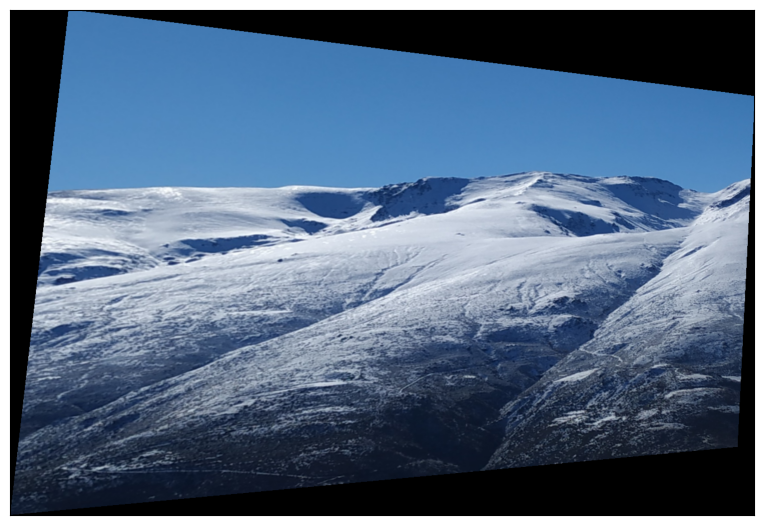

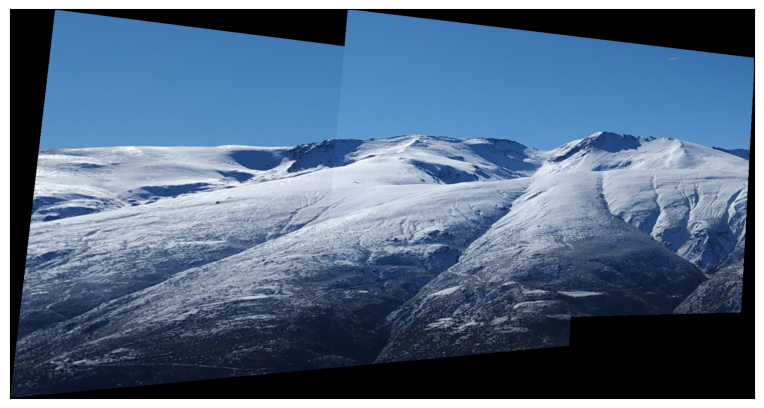

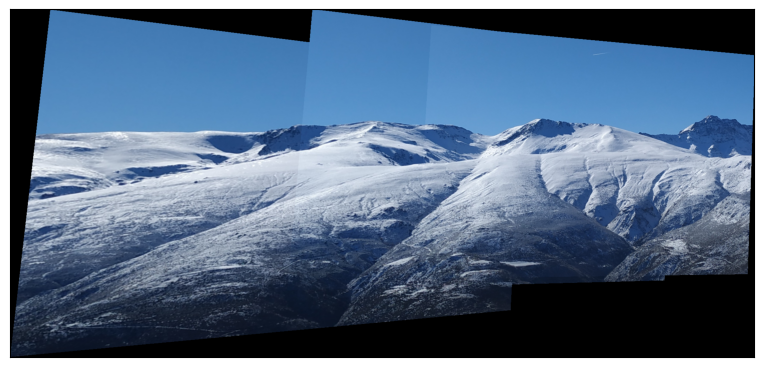

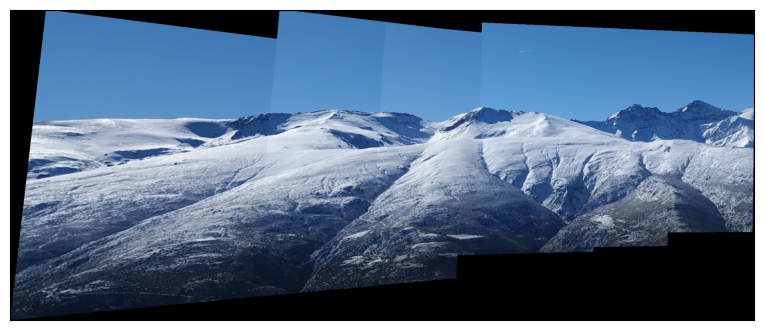

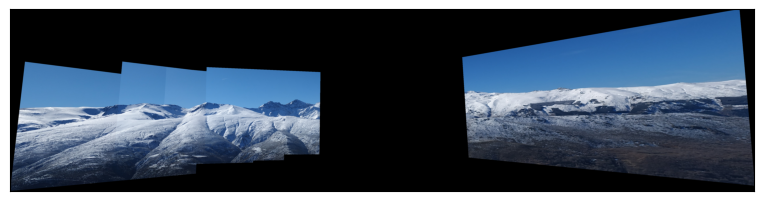

...

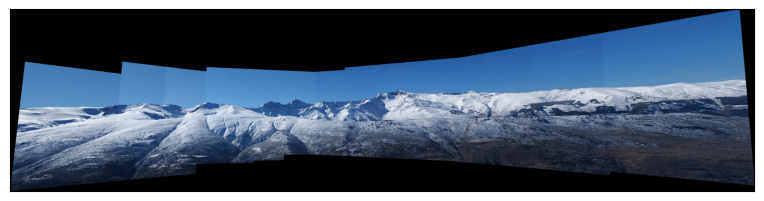

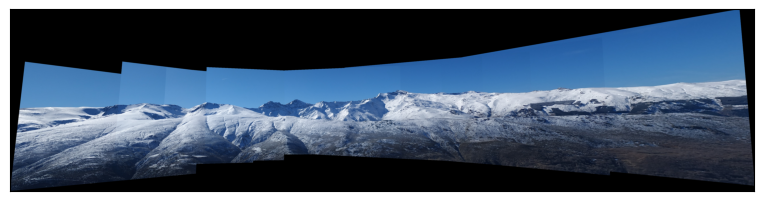

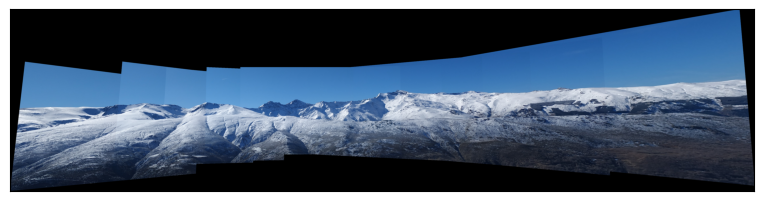

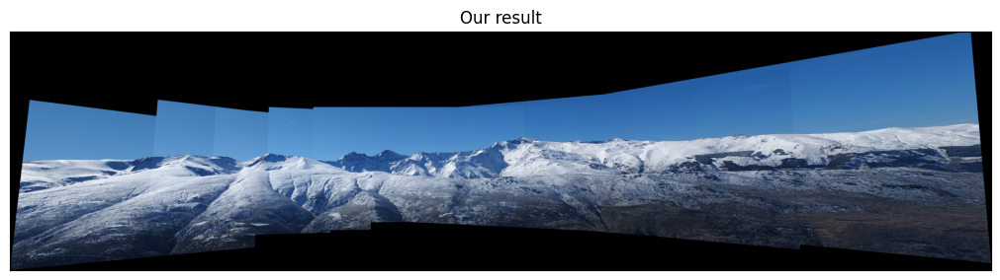

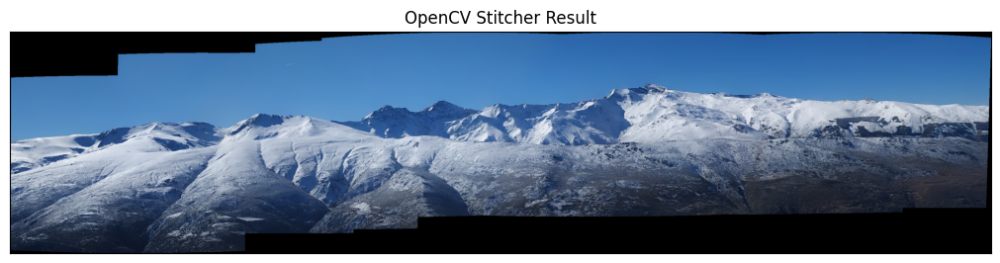

In [ ]:
PREFIX='IMG_20220312_1029'
nameImages=['34_S.jpg','37_S.jpg','40_S.jpg','42_S.jpg','44_S.jpg','46_S.jpg','48_S.jpg','50_S.jpg','51_S.jpg','54_S.jpg','57_S.jpg']

# Leemos las imágenes
images=[]
for item in nameImages:
   images.append(cv2.resize(readIm(get_image(PREFIX+item),flagColor=1), (0,0), fx=0.5, fy=0.5))

# Calculamos las homografías locales
H_local = computeLocalHomographies(images, 'BF+CC')

# Creamos el canvas inicial
h, w = images[0].shape[:2]
canvas = setCanvas(h, w, flagColor=True, nim=11)

# Imagen central
#idx_central = len(images) // 2
idx_central = 4

# Homografía para la imagen central
H0 = axesHomography(images[idx_central].shape[:2], canvas.shape[:2])

# Homografías globales
H_global = mosaicHomographies(H_local, idx_central, H0)

# Componemos el mosaico
mosaic, steps = composeMosaic(images, canvas, H_global, idx_central)

# Vamos mostrando cada paso
for i in steps:
  i = blackOut(i)
  displayIm(i, title="", factor=1.5)

# Eliminamos los bordes negros
mosaic_cropped = blackOut(mosaic)

# Mostramos el resultado
displayIm(mosaic_cropped, title="Our result", factor=2)

# Comparación con el Stitcher de OpenCV
stitcher = cv2.Stitcher_create()
status, stitched = stitcher.stitch(images)
if status == cv2.Stitcher_OK:
  displayIm(stitched, title="OpenCV Stitcher Result", factor=2)
else:
  print("Error in OpenCV Stitcher.")


- Leemos las imágenes y las redimensionamos para que esten al 50% de su tamaño original. Esto beneficia al tiempo y coste computacional.
- Calculamos las homografías locales entre todas las imágenes adyacentes. Yo lo hago usando BF+CC porque es el método que me dio mejores resultados en los emparejamientos del ejercicio 2 de esta misma práctica, pero también podríamos usar KNN.
- Creamos el canvas donde pondremos todas las imágenes, e indicamos que van a ser 11 imágenes a color, para que tenga 3 canales.
- Escojo el índice central como 4 en lugar de escogerlo como 5 (len(images)//2) ya que observamos que las imágenes de la derecha están menos alineadas (vemos en las de la izquierda que se superpone prácticamente media imagen en las 4 primeras, mientras que en las de la derecha, apenas se superponen un poco), por lo que es conveniente mover la imagen central un poco a la izquierda para que sea más fácil la alineación y no queden tan distorsionadas las imágenes de la derecha.
- Calculamos la homografía que lleva la imagen central al centro del canvas.
- Calculamos las homografías globales que transforman todas las imágenes al canvas.
- Usamos dichas homografías globales para transformar las imágenes y componer el mosaico final.
- Voy mostrando cada paso del proceso de construcción del panorama final, y hago blackOut en cada paso, para ajustar el canvas lo más posible a las imágenes que se muestran y facilitar la vista.
- Comparo con el mosaico que crea cv2.Stitcher_create(), para ver si nuestro método ha creado el panorama correctamente o detectamos errores. Vemos que ambos están muy parecidos, aunque en el de Stitcher se notan un poco menos las transiciones entre imágenes (en el nuestro se ven un poco los bordes de las imágenes) y se ve todo un poco más alineado hacia adelante, en lugar de hacer una especie de pico hacia el fondo en la imagen central. Esto puede ser porque Stitcher usa una proyeción cilíndrica o esférica que suaviza la transición entre imágenes al proyectarlas en una superficie curva, lo que disminuye el efecto de pico hacia el fondo, que en nuestro caso ocurre porque es la imagen central la que está directamente alineada con el canvas, pero las demás no. Además, la imagen se corta un poco por la derecha en el caso de Stitcher, perdiendo un poco de información.